In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn

%matplotlib inline

### 데이터 불러오기

In [2]:
c15 = pd.read_csv('dataset/Challenger_Ranked_Games_15minute.csv')
c15

,gameId,blueWins,blueTotalGolds,blueCurrentGolds,blueTotalLevel,blueAvgLevel,blueTotalMinionKills,blueTotalJungleMinionKills,blueFirstBlood,blueKill,...,redFirstTowerLane,redTowerKills,redMidTowerKills,redTopTowerKills,redBotTowerKills,redInhibitor,redFirstDragon,redDragnoType,redDragon,redRiftHeralds
0,4247263043,0,24081,1190,44,8.8,309,74,0,8,...,['MID_LANE'],2,1,0,1,0,1,"['WATER_DRAGON', 'EARTH_DRAGON']",2,1
1,4247155821,1,24162,2212,46,9.2,393,64,0,5,...,['TOP_LANE'],1,0,1,0,0,0,[],0,0
2,4243963257,0,22413,1563,41,8.2,300,62,0,5,...,['BOT_LANE'],4,2,1,1,0,1,"['FIRE_DRAGON', 'EARTH_DRAGON']",2,1
3,4241678498,0,23837,3197,46,9.2,370,96,0,6,...,['TOP_LANE'],1,0,1,0,0,0,[],0,1
4,4241538868,1,27688,3663,44,8.8,381,66,0,9,...,['BOT_LANE'],2,1,0,1,0,0,[],0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26829,4143231833,0,26110,1535,46,9.2,289,73,0,15,...,['BOT_LANE'],1,0,0,1,0,1,['WATER_DRAGON'],1,1
26830,4157911901,0,57503,3293,62,12.4,329,28,0,27,...,[],6,2,1,3,1,0,[],0,0
26831,3764171638,0,26091,2986,47,9.4,338,86,0,7,...,[],0,0,0,0,0,0,[],0,0
26832,4110201724,1,24734,4289,45,9.0,328,64,0,11,...,['BOT_LANE'],1,0,0,1,0,0,['AIR_DRAGON'],1,0


In [3]:
pd.options.display.max_columns = len(c15.columns)

In [4]:
c15.columns

Index(['gameId', 'blueWins', 'blueTotalGolds', 'blueCurrentGolds',
       'blueTotalLevel', 'blueAvgLevel', 'blueTotalMinionKills',
       'blueTotalJungleMinionKills', 'blueFirstBlood', 'blueKill', 'blueDeath',
       'blueAssist', 'blueWardPlaced', 'blueWardKills', 'blueFirstTower',
       'blueFirstInhibitor', 'blueFirstTowerLane', 'blueTowerKills',
       'blueMidTowerKills', 'blueTopTowerKills', 'blueBotTowerKills',
       'blueInhibitor', 'blueFirstDragon', 'blueDragnoType', 'blueDragon',
       'blueRiftHeralds', 'redWins', 'redTotalGolds', 'redCurrentGolds',
       'redTotalLevel', 'redAvgLevel', 'redTotalMinionKills',
       'redTotalJungleMinionKills', 'redFirstBlood', 'redKill', 'redDeath',
       'redAssist', 'redWardPlaced', 'redWardKills', 'redFirstTower',
       'redFirstInhibitor', 'redFirstTowerLane', 'redTowerKills',
       'redMidTowerKills', 'redTopTowerKills', 'redBotTowerKills',
       'redInhibitor', 'redFirstDragon', 'redDragnoType', 'redDragon',
       'redRift

#### 얕은 복사로 데이터 손상 방지

In [5]:
df1 = c15.copy()

#### 이상치 제거(데이터가 0일 수 없는, 오염된 데이터 처리)

In [6]:
df1[df1['blueKill']==0]

,gameId,blueWins,blueTotalGolds,blueCurrentGolds,blueTotalLevel,blueAvgLevel,blueTotalMinionKills,blueTotalJungleMinionKills,blueFirstBlood,blueKill,blueDeath,blueAssist,blueWardPlaced,blueWardKills,blueFirstTower,blueFirstInhibitor,blueFirstTowerLane,blueTowerKills,blueMidTowerKills,blueTopTowerKills,blueBotTowerKills,blueInhibitor,blueFirstDragon,blueDragnoType,blueDragon,blueRiftHeralds,redWins,redTotalGolds,redCurrentGolds,redTotalLevel,redAvgLevel,redTotalMinionKills,redTotalJungleMinionKills,redFirstBlood,redKill,redDeath,redAssist,redWardPlaced,redWardKills,redFirstTower,redFirstInhibitor,redFirstTowerLane,redTowerKills,redMidTowerKills,redTopTowerKills,redBotTowerKills,redInhibitor,redFirstDragon,redDragnoType,redDragon,redRiftHeralds
54,4141756373,0,4241,2241,11,2.2,41,0,0,0,1,0,3,0,0,0,[],0,0,0,0,0,0,[],0,0,1,5329,2829,13,2.6,46,16,0,1,0,1,3,0,0,0,[],0,0,0,0,0,0,[],0,0
429,4244722484,1,4517,2017,13,2.6,43,16,0,0,0,0,4,0,0,0,[],0,0,0,0,0,0,[],0,0,0,3922,1922,11,2.2,38,0,0,0,0,0,2,0,0,0,[],0,0,0,0,0,0,[],0,0
533,4229227509,1,22816,3176,44,8.8,444,85,0,0,4,0,45,14,0,0,[],0,0,0,0,0,0,[],0,0,0,24549,4169,46,9.2,416,87,0,4,0,6,44,18,1,0,['BOT_LANE'],1,0,0,1,0,1,"['EARTH_DRAGON', 'AIR_DRAGON']",2,1
996,4142319988,0,21330,3270,43,8.6,366,83,0,0,11,0,70,17,0,0,[],0,0,0,0,0,0,[],0,0,1,29088,5938,48,9.6,405,80,0,11,0,15,74,16,1,0,['MID_LANE'],3,2,1,0,0,1,['EARTH_DRAGON'],1,1
1089,4242980151,1,4822,2322,13,2.6,53,16,0,0,0,0,5,0,0,0,[],0,0,0,0,0,0,[],0,0,0,4105,2105,11,2.2,22,12,0,0,0,0,1,0,0,0,[],0,0,0,0,0,0,[],0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25694,4075049701,0,21120,2495,45,9.0,381,87,0,0,9,0,34,11,0,0,[],0,0,0,0,0,1,['AIR_DRAGON'],1,0,1,25721,7131,48,9.6,405,89,0,9,0,11,35,10,1,0,['TOP_LANE'],1,0,1,0,0,0,['EARTH_DRAGON'],1,1
25753,4084488190,0,4476,1976,12,2.4,31,18,0,0,2,0,1,0,0,0,[],0,0,0,0,0,0,[],0,0,1,5433,2708,12,2.4,38,12,0,2,0,2,15,0,0,0,[],0,0,0,0,0,0,[],0,0
25809,4174666690,0,4254,2254,11,2.2,24,12,0,0,0,0,2,0,0,0,[],0,0,0,0,0,0,[],0,0,1,4582,2082,12,2.4,49,11,0,0,0,0,16,0,0,0,[],0,0,0,0,0,0,[],0,0
25999,4043074098,0,4193,1843,11,2.2,32,12,0,0,1,0,3,0,0,0,[],0,0,0,0,0,0,[],0,0,1,5025,2525,13,2.6,44,12,0,1,0,1,4,1,0,0,[],0,0,0,0,0,0,[],0,0


In [7]:
df1[df1['redKill']==0]

,gameId,blueWins,blueTotalGolds,blueCurrentGolds,blueTotalLevel,blueAvgLevel,blueTotalMinionKills,blueTotalJungleMinionKills,blueFirstBlood,blueKill,blueDeath,blueAssist,blueWardPlaced,blueWardKills,blueFirstTower,blueFirstInhibitor,blueFirstTowerLane,blueTowerKills,blueMidTowerKills,blueTopTowerKills,blueBotTowerKills,blueInhibitor,blueFirstDragon,blueDragnoType,blueDragon,blueRiftHeralds,redWins,redTotalGolds,redCurrentGolds,redTotalLevel,redAvgLevel,redTotalMinionKills,redTotalJungleMinionKills,redFirstBlood,redKill,redDeath,redAssist,redWardPlaced,redWardKills,redFirstTower,redFirstInhibitor,redFirstTowerLane,redTowerKills,redMidTowerKills,redTopTowerKills,redBotTowerKills,redInhibitor,redFirstDragon,redDragnoType,redDragon,redRiftHeralds
10,4229039003,0,4918,2918,12,2.4,38,12,0,1,0,1,3,0,0,0,[],0,0,0,0,0,0,[],0,0,1,4834,2334,13,2.6,48,20,0,0,1,0,3,1,0,0,[],0,0,0,0,0,0,[],0,0
360,4174568521,1,5530,3030,13,2.6,50,16,0,1,0,1,4,0,0,0,[],0,0,0,0,0,0,[],0,0,0,4064,2064,10,2.0,31,0,0,0,1,0,2,1,0,0,[],0,0,0,0,0,0,[],0,0
429,4244722484,1,4517,2017,13,2.6,43,16,0,0,0,0,4,0,0,0,[],0,0,0,0,0,0,[],0,0,0,3922,1922,11,2.2,38,0,0,0,0,0,2,0,0,0,[],0,0,0,0,0,0,[],0,0
492,4215313840,0,5538,3038,12,2.4,42,4,0,2,0,1,1,0,0,0,[],0,0,0,0,0,0,[],0,0,1,4810,1635,13,2.6,46,12,0,0,2,0,3,0,0,0,[],0,0,0,0,0,0,[],0,0
550,4214795739,1,5592,2042,14,2.8,54,24,0,1,0,1,5,1,0,0,[],0,0,0,0,0,0,[],0,0,0,4321,2246,11,2.2,29,12,0,0,1,0,3,0,0,0,[],0,0,0,0,0,0,[],0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25489,4120657801,1,6027,3352,14,2.8,51,20,0,3,0,0,5,1,0,0,[],0,0,0,0,0,0,[],0,0,0,3945,2220,9,1.8,26,4,0,0,3,0,3,1,0,0,[],0,0,0,0,0,0,[],0,0
25809,4174666690,0,4254,2254,11,2.2,24,12,0,0,0,0,2,0,0,0,[],0,0,0,0,0,0,[],0,0,1,4582,2082,12,2.4,49,11,0,0,0,0,16,0,0,0,[],0,0,0,0,0,0,[],0,0
25883,3888931077,1,5102,2602,13,2.6,41,16,0,1,0,1,4,0,0,0,[],0,0,0,0,0,0,[],0,0,0,3539,1389,10,2.0,17,0,0,0,1,0,2,0,0,0,[],0,0,0,0,0,0,[],0,0
26661,3964445578,1,4818,2318,11,2.2,43,7,0,1,0,1,3,1,0,0,[],0,0,0,0,0,0,[],0,0,0,3919,1844,9,1.8,24,9,0,0,1,0,2,0,0,0,[],0,0,0,0,0,0,[],0,0


In [8]:
print((df1["blueTotalMinionKills"]==0).sum())

1


In [9]:
print((df1["blueTotalJungleMinionKills"]==0).sum())

1946


In [10]:
print((df1["redTotalMinionKills"]==0).sum())

2


In [11]:
print((df1["redTotalJungleMinionKills"]==0).sum())

1958


In [12]:
is0 = df1[(df1.blueKill != 0) & (df1.redKill != 0) & (df1.blueTotalMinionKills != 0) & (df1.blueTotalJungleMinionKills != 0) & (df1.redTotalMinionKills != 0) & (df1.redTotalJungleMinionKills != 0)]

In [13]:
df1.shape

(26834, 51)

In [14]:
is0.shape

(24625, 51)

In [15]:
df1 = is0
df1

,gameId,blueWins,blueTotalGolds,blueCurrentGolds,blueTotalLevel,blueAvgLevel,blueTotalMinionKills,blueTotalJungleMinionKills,blueFirstBlood,blueKill,blueDeath,blueAssist,blueWardPlaced,blueWardKills,blueFirstTower,blueFirstInhibitor,blueFirstTowerLane,blueTowerKills,blueMidTowerKills,blueTopTowerKills,blueBotTowerKills,blueInhibitor,blueFirstDragon,blueDragnoType,blueDragon,blueRiftHeralds,redWins,redTotalGolds,redCurrentGolds,redTotalLevel,redAvgLevel,redTotalMinionKills,redTotalJungleMinionKills,redFirstBlood,redKill,redDeath,redAssist,redWardPlaced,redWardKills,redFirstTower,redFirstInhibitor,redFirstTowerLane,redTowerKills,redMidTowerKills,redTopTowerKills,redBotTowerKills,redInhibitor,redFirstDragon,redDragnoType,redDragon,redRiftHeralds
0,4247263043,0,24081,1190,44,8.8,309,74,0,8,14,14,29,8,0,0,[],0,0,0,0,0,0,[],0,0,1,30099,6073,48,9.6,366,76,0,14,8,34,31,12,1,0,['MID_LANE'],2,1,0,1,0,1,"['WATER_DRAGON', 'EARTH_DRAGON']",2,1
1,4247155821,1,24162,2212,46,9.2,393,64,0,5,6,5,31,6,0,0,[],0,0,0,0,0,0,[],0,1,0,26015,3900,48,9.6,394,89,0,6,5,5,26,11,1,0,['TOP_LANE'],1,0,1,0,0,0,[],0,0
2,4243963257,0,22413,1563,41,8.2,300,62,0,5,20,8,28,7,0,0,[],0,0,0,0,0,0,[],0,0,1,34296,5496,50,10.0,388,85,0,20,5,20,39,9,1,0,['BOT_LANE'],4,2,1,1,0,1,"['FIRE_DRAGON', 'EARTH_DRAGON']",2,1
3,4241678498,0,23837,3197,46,9.2,370,96,0,6,13,9,108,9,0,0,[],0,0,0,0,0,1,['AIR_DRAGON'],1,0,1,27824,5223,48,9.6,405,72,0,13,6,24,26,13,1,0,['TOP_LANE'],1,0,1,0,0,0,[],0,1
4,4241538868,1,27688,3663,44,8.8,381,66,0,9,10,10,36,11,0,0,[],1,0,1,0,0,1,['WATER_DRAGON'],1,1,0,25826,2909,47,9.4,329,87,0,10,9,17,41,9,1,0,['BOT_LANE'],2,1,0,1,0,0,[],0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26829,4143231833,0,26110,1535,46,9.2,289,73,0,15,14,25,38,9,0,0,[],0,0,0,0,0,0,['EARTH_DRAGON'],1,0,1,27301,3931,47,9.4,323,84,0,14,15,17,30,11,1,0,['BOT_LANE'],1,0,0,1,0,1,['WATER_DRAGON'],1,1
26830,4157911901,0,57503,3293,62,12.4,329,28,0,27,37,33,36,2,1,0,['TOP_LANE'],5,3,2,0,1,1,"['WATER_DRAGON', 'AIR_DRAGON', 'FIRE_DRAGON']",3,0,1,62919,6253,64,12.8,428,120,0,37,27,29,41,0,0,1,[],6,2,1,3,1,0,[],0,0
26831,3764171638,0,26091,2986,47,9.4,338,86,0,7,6,8,40,12,1,0,['TOP_LANE'],1,0,1,0,0,0,[],0,0,1,25579,1897,46,9.2,377,88,0,6,7,8,80,8,0,0,[],0,0,0,0,0,0,[],0,0
26832,4110201724,1,24734,4289,45,9.0,328,64,0,11,7,20,33,10,0,0,[],0,0,0,0,0,1,['FIRE_DRAGON'],1,0,0,23593,4668,43,8.6,343,67,0,7,11,11,31,13,1,0,['BOT_LANE'],1,0,0,1,0,0,['AIR_DRAGON'],1,0


#### 컬럼 간 결정계수 분석

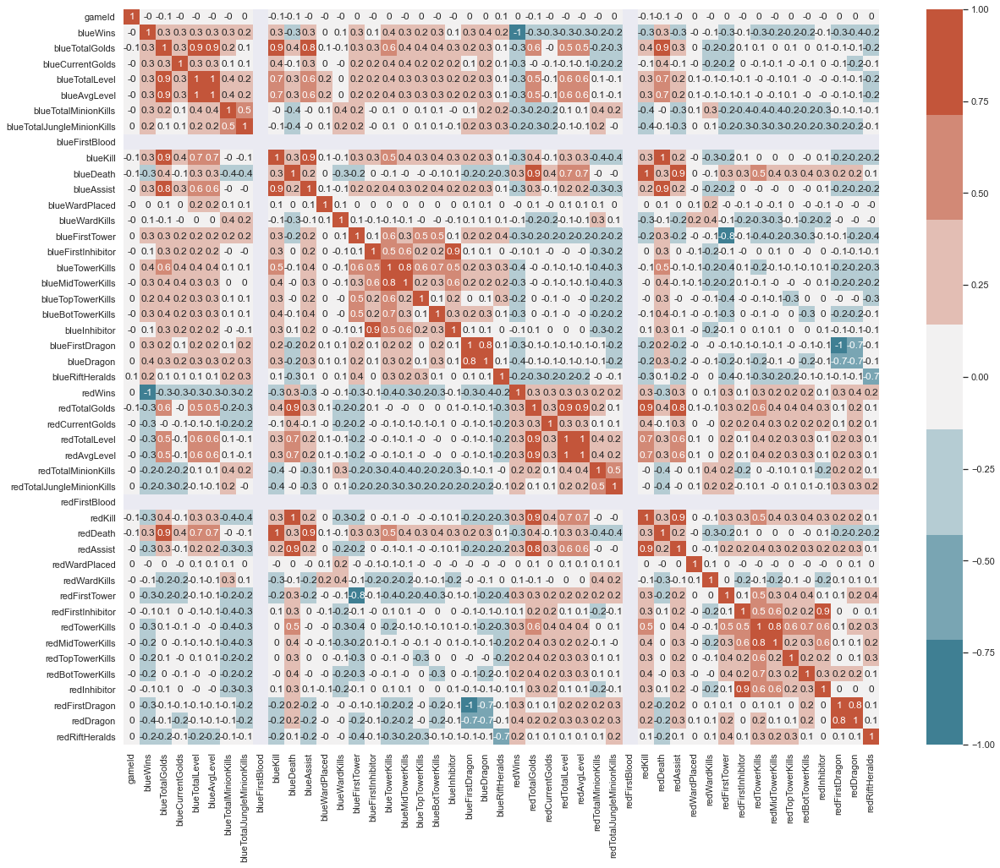

In [16]:
corr_mat = (df1.corr()).round(1)
sns.set(rc={'figure.figsize':(20, 16)})
sns.heatmap(data=corr_mat, annot=True, cmap=sns.diverging_palette(220, 20, n=7));

### 데이터 전처리
- blue, red 팀 간 중복되는 데이터들을 차등함으로 데이터 비교를 보다 수월하게 하기 위한 작업

#### Diff 컬럼 생성

In [17]:
df1["blueTotalGoldDiff"] = df1.blueTotalGolds - df1.redTotalGolds
df1["FirstBloodDiff"] = df1.blueFirstBlood - df1.redFirstBlood
df1["FirstTowerDiff"] = df1.blueFirstTower - df1.redFirstTower
df1["HeraldDiff"] = df1.blueRiftHeralds - df1.redRiftHeralds
df1["FirstDragonDiff"] = df1.blueFirstDragon - df1.redFirstDragon
df1["TowerKillDiff"] = df1.blueTowerKills - df1.redTowerKills
df1["TotalWardsKillDiff"] = df1.blueWardKills - df1.redWardKills
df1["TotalAssistDiff"] = df1.blueAssist - df1.redAssist
df1["AvgLevelDiff"] = df1.blueAvgLevel - df1.redAvgLevel
df1["TotalMinionKills"] = df1.blueTotalMinionKills - df1.redTotalMinionKills
df1["TotalJungleMinionKills"] = df1.blueTotalJungleMinionKills - df1.redTotalJungleMinionKills
df1["blueTotalGoldDiff"] = df1.blueTotalGolds - df1.redTotalGolds

#### 컬럼명 재설정

In [18]:
df1.rename({'blueWins':'Win', 'blueDeath':'Death', 'FirstTowerDiff':'FirstTower', 'blueTotalGoldDiff': 'TotalGoldDiff','TotalMinionKills':'TotalMinionDiff' ,'TotalJungleMinionKills': 'TotalJungleMinionDiff', 'FirstDragonDiff':'FirstDragon', 'blueKill' : 'Kill'}, axis='columns', inplace=True)

In [19]:
df1 = df1[["gameId", "Win", "TotalGoldDiff", "AvgLevelDiff", "TotalAssistDiff", "Kill", "Death", "TotalMinionDiff", "TotalJungleMinionDiff", "FirstTower", "TowerKillDiff", "HeraldDiff", "FirstDragon", "TotalWardsKillDiff"]]

In [20]:
df1

,gameId,Win,TotalGoldDiff,AvgLevelDiff,TotalAssistDiff,Kill,Death,TotalMinionDiff,TotalJungleMinionDiff,FirstTower,TowerKillDiff,HeraldDiff,FirstDragon,TotalWardsKillDiff
0,4247263043,0,-6018,-0.8,-20,8,14,-57,-2,-1,-2,-1,-1,-4
1,4247155821,1,-1853,-0.4,0,5,6,-1,-25,-1,-1,1,0,-5
2,4243963257,0,-11883,-1.8,-12,5,20,-88,-23,-1,-4,-1,-1,-2
3,4241678498,0,-3987,-0.4,-15,6,13,-35,24,-1,-1,-1,1,-4
4,4241538868,1,1862,-0.6,-7,9,10,52,-21,-1,-1,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26829,4143231833,0,-1191,-0.2,8,15,14,-34,-11,-1,-1,-1,-1,-2
26830,4157911901,0,-5416,-0.4,4,27,37,-99,-92,1,-1,0,1,2
26831,3764171638,0,512,0.2,0,7,6,-39,-2,1,1,0,0,4
26832,4110201724,1,1141,0.4,9,11,7,-15,-3,-1,-1,0,1,-3


### 시각화 및 상관관계 파악

#### 상관관계 파악

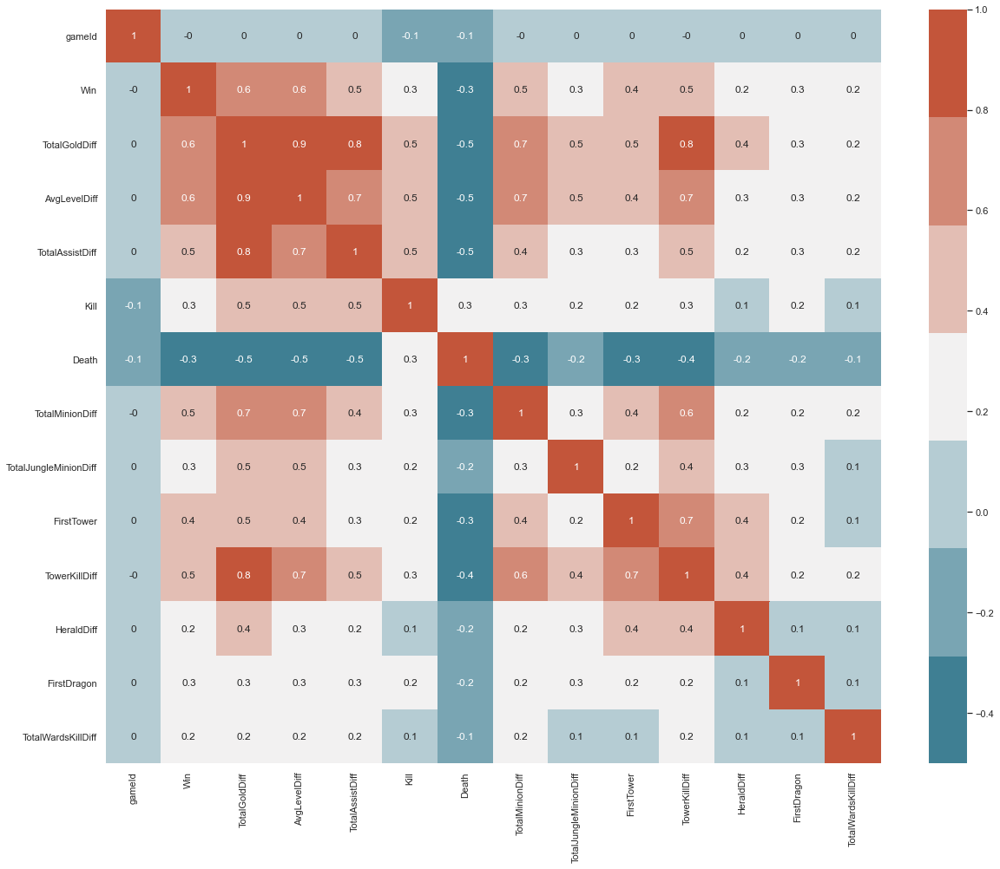

In [21]:
corr_mat = (df1.corr()).round(1)
sns.set(rc={'figure.figsize':(20, 16)})
sns.heatmap(data=corr_mat, annot=True, cmap=sns.diverging_palette(220, 20, n=7));

#### 시각화

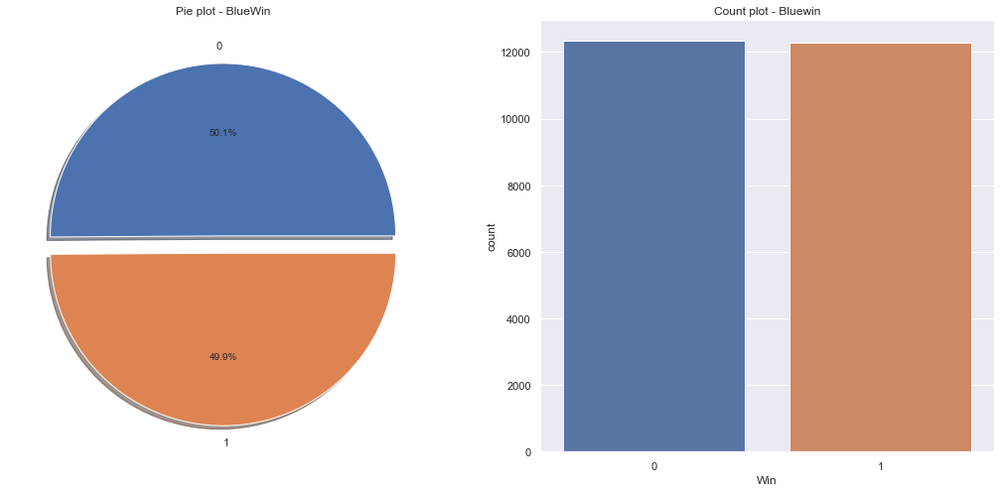

In [22]:
# 승률

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

f, ax = plt.subplots(1, 2, figsize=(18, 8))

df1['Win'].value_counts().plot.pie(explode=[0, 0.1],
                                  autopct='%1.1f%%', ax=ax[0], shadow=True)

ax[0].set_title('Pie plot - BlueWin')
ax[0].set_ylabel('')
sns.countplot('Win', data=df1, ax=ax[1])
ax[1].set_title('Count plot - Bluewin')

plt.show()

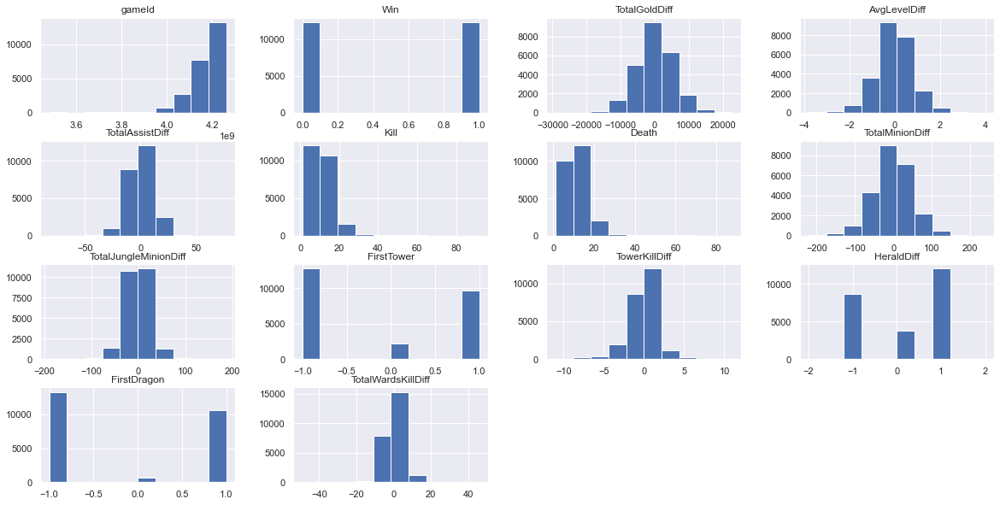

In [23]:
# 여러 데이터를 가져와 그래프로 시각화
import matplotlib.pyplot as plt
%matplotlib inline

df1.hist(bins=10,figsize=(20,10))
plt.show()

### 승/패에 영향을 끼치는 요인 분석(feature_importances_)을 위한 train_test_split 진행

In [24]:
X = df1.iloc[:, 2:]
y = df1['Win']

#### train_test_split

In [25]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=13)
np.unique(y_train, return_counts=True)

(array([0, 1], dtype=int64), array([9863, 9837]))

In [26]:
feature_name = list(X)
X_train.columns = feature_name
X_test.columns = feature_name
X_train.head()

,TotalGoldDiff,AvgLevelDiff,TotalAssistDiff,Kill,Death,TotalMinionDiff,TotalJungleMinionDiff,FirstTower,TowerKillDiff,HeraldDiff,FirstDragon,TotalWardsKillDiff
20664,-7310,-1.6,-5,6,14,-54,-51,-1,-4,-1,0,-6
22973,3033,0.8,5,9,6,-12,-3,1,1,1,-1,8
18087,-10822,-2.0,-17,3,19,-94,-38,-1,-4,-1,-1,2
16651,2839,0.6,5,11,5,28,4,0,0,-1,-1,7
10558,-10462,-1.6,-21,2,15,-78,-8,-1,-6,-1,-1,2


#### train, test 모델 데이터 갯수 파악

In [27]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((19700, 12), (4925, 12), (19700,), (4925,))

#####  승/패(y_train) 확인

In [28]:
y_train.value_counts()
# 블루팀 승 : 9863
# 블루팀 패 : 9837

0    9863
1    9837
Name: Win, dtype: int64

#### RandomForestClassfier 모델 사용

In [29]:
%config IPCompleter.greedy=True

In [30]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=13, n_estimators=100, max_depth=4)
rf.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=4, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=13, verbose=0,
                       warm_start=False)

In [31]:
# 그리드서치 임포트해서 랜덤포레스트 적용
# 최적의 조건을 구해봤습니다
# n_estimator? 

from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

params = {
    'max_depth' : [4, 6, 8, 10],
    'n_estimators' : [50, 100, 200],
    'min_samples_leaf' : [8, 12],
    'min_samples_split' : [8, 12]
}

rf_clf = RandomForestClassifier(random_state=13, n_jobs=-1)
grid_cv = GridSearchCV(rf_clf, param_grid=params, cv=2, n_jobs=-1)
grid_cv.fit(X_train, y_train)

GridSearchCV(cv=2, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=-1,
                                              oob_score=False, random_state=13,
                                    

In [32]:
# 최종 결과 모델 중 Best one
from sklearn.metrics import accuracy_score

rf_clf_best = grid_cv.best_estimator_
rf_clf_best.fit(X_train, y_train)

pred1 = rf_clf_best.predict(X_test)

accuracy_score(y_test, pred1)

0.8036548223350254

### Feature_importances

In [33]:
# 승/패에 가장 영향을 주는 요인들 나열
best_cols_values = rf_clf_best.feature_importances_
best_cols = pd.Series(best_cols_values, index=X_train.columns)
top20_cols = best_cols.sort_values(ascending=False)[:20]
top20_cols

TotalGoldDiff            0.405459
AvgLevelDiff             0.248611
TotalAssistDiff          0.139916
Kill                     0.065664
TotalMinionDiff          0.051768
Death                    0.042369
TowerKillDiff            0.020570
FirstTower               0.011827
FirstDragon              0.008454
TotalJungleMinionDiff    0.004269
HeraldDiff               0.001049
TotalWardsKillDiff       0.000043
dtype: float64

In [34]:
pd.DataFrame(top20_cols)

,0
TotalGoldDiff,0.405459
AvgLevelDiff,0.248611
TotalAssistDiff,0.139916
Kill,0.065664
TotalMinionDiff,0.051768
Death,0.042369
TowerKillDiff,0.020570
FirstTower,0.011827
FirstDragon,0.008454
TotalJungleMinionDiff,0.004269


In [35]:
import pandas_profiling as pp

In [36]:
pp.ProfileReport(df1)